# Convolution Function

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Callable
import plotly.graph_objects as go



### Activation Functions

In [44]:
def relu(x):
    return np.maximum(0, x)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)

def leaky_relu(x, alpha=0.01):
    return np.where(x > 0, x, x * alpha)

In [45]:
#Assuming Single Kernel Per Function Call, Works only for 3d
def convolution_fun(image: np.ndarray, kernel: np.ndarray, stride: int, padding: int, activation_fun: Callable[[np.ndarray], np.ndarray]) -> np.ndarray:
    if image.shape[2] != kernel.shape[2]:
        raise ValueError("Image and kernel must have the same number of channels.")
    if kernel.shape[0] != kernel.shape[1]:
        raise ValueError("Kernel must be a square matrix.")
    
    # Padding the image
    padded_image = np.pad(image, ((padding, padding), (padding, padding), (0, 0)), 'constant', constant_values=0)

    output_height = ((padded_image.shape[0] - kernel.shape[0]) // stride) + 1
    output_width = ((padded_image.shape[1] - kernel.shape[1]) // stride) + 1
    output = np.zeros((output_height, output_width))


     # Perform convolution
    for h in range(output_height):
        for w in range(output_width):
            h_start = h * stride
            h_end = h_start + kernel.shape[0]
            w_start = w * stride
            w_end = w_start + kernel.shape[1]
            
            # Convolve over the entire depth of the input image
            output[h, w] = np.sum(padded_image[h_start:h_end, w_start:w_end, :] * kernel)

    
     # Apply activation function
    activation_output = activation_fun(output)

    return activation_output

In [46]:
# Read the image
image_path = "IITH_logo_Small.jpg"
image = plt.imread(image_path)
# If the image has an alpha channel, you might want to remove it or convert the image to grayscale
if image.shape[2] == 4:
    image = image[:, :, :3]

print("Original image shape:", image.shape)

# Example filter kernel matching input depth (2x2 pixels, input depth)
kernel_standard_cnn = np.random.rand(2, 2, image.shape[2])  # Match the input image depth
kernel = np.array([[[-1, 0, 1],
                    [-1, 0, 1],
                    [-1, 0, 1]],
                    [[-1, 0, 1],
                    [-1, 0, 1],
                    [-1, 0, 1]],
                    [[-1, 0, 1],
                    [-1, 0, 1],
                    [-1, 0, 1]]
                    ])
# Define the stride and padding
stride = 1
padding = 1

# Call the convolution function
result_relu = convolution_fun(image, kernel, stride, padding, relu)
result_sigmoid = convolution_fun(image, kernel, stride, padding, sigmoid)
result_tanh = convolution_fun(image, kernel, stride, padding, tanh)
result_leaky_relu = convolution_fun(image, kernel, stride, padding, leaky_relu)


Original image shape: (225, 225, 3)


C:\Users\gupta\AppData\Local\Temp\ipykernel_10512\1439857521.py:5: RuntimeWarning:

overflow encountered in exp



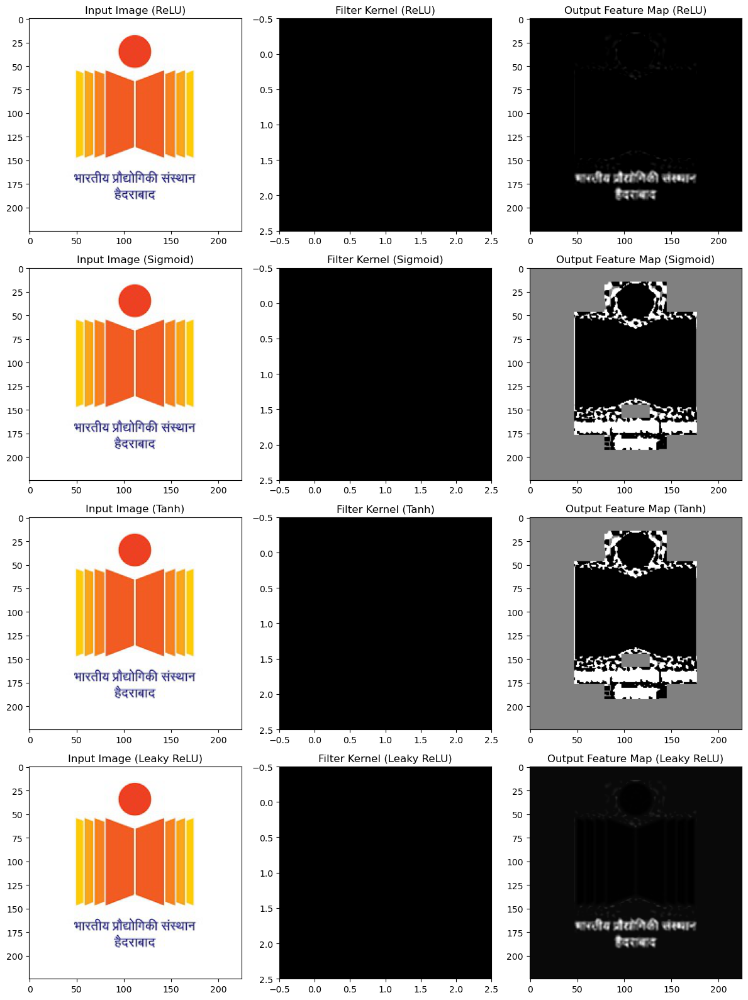

In [47]:
# Set up the figure size to accommodate all subplots
plt.figure(figsize=(12, 16))

# Activation functions' names for titles
activation_titles = ['ReLU', 'Sigmoid', 'Tanh', 'Leaky ReLU']


results = [result_relu, result_sigmoid, result_tanh, result_leaky_relu]

# Loop through the results and plot the input image, kernel, and each output feature map
for i, result in enumerate(results):
    # Plot input image for each activation function
    plt.subplot(4, 3, 3*i + 1)
    plt.imshow(image)
    plt.title(f'Input Image ({activation_titles[i]})')
    
    # Plot filter kernel for each activation function
    plt.subplot(4, 3, 3*i + 2)
    
    plt.imshow(kernel[:, :, 0], cmap='gray')
    plt.title(f'Filter Kernel ({activation_titles[i]})')
    
    # Plot the output feature map for each activation function
    plt.subplot(4, 3, 3*i + 3)
    plt.imshow(result, cmap='gray')
    plt.title(f'Output Feature Map ({activation_titles[i]})')

plt.tight_layout()  # Adjust subplots to fit in the figure area
plt.show()


# Pooling Function

In [48]:
def pooling_fun(activation_map: np.ndarray, stride: int, pool_kernel_size: int, pool_fun: Callable[[np.ndarray], np.ndarray]) -> np.ndarray:
    # Adjust the shape for single channel images
    if len(activation_map.shape) < 3:
        activation_map = activation_map[:, :, np.newaxis]

    height, width, depth = activation_map.shape

    # Calculate output dimensions
    out_height = int((height - pool_kernel_size) / stride) + 1
    out_width = int((width - pool_kernel_size) / stride) + 1

    # Initialize output
    output = np.zeros((out_height, out_width, depth))

    for z in range(depth):
        for h in range(out_height):
            for w in range(out_width):
                h_start = h * stride
                w_start = w * stride
                h_end = h_start + pool_kernel_size
                w_end = w_start + pool_kernel_size
                # Apply pooling function
                output[h, w, z] = pool_fun(activation_map[h_start:h_end, w_start:w_end, z])

    # Squeeze output in case of single depth to maintain 2D format for single-channel images
    if output.shape[-1] == 1:
        output = np.squeeze(output, axis=-1)
    
    return output

In [49]:
def max_pooling(region: np.ndarray) -> np.ndarray:
    return np.max(region)

def min_pooling(region: np.ndarray) -> np.ndarray:
    return np.min(region)

def avg_pooling(region: np.ndarray) -> np.ndarray:
    return np.average(region)

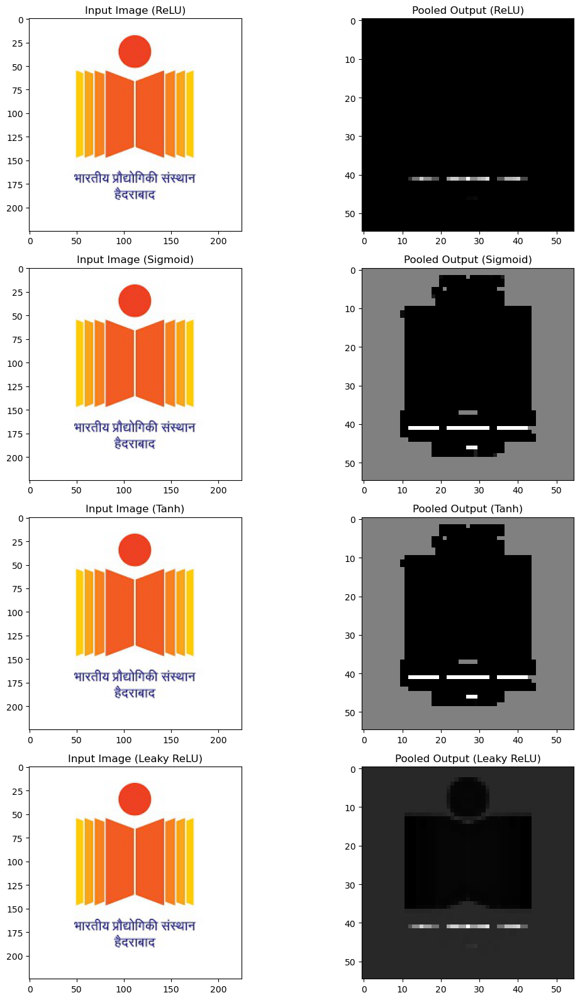

In [50]:
# Initialize a list to hold the pooled results
pooled_results = []

# Apply pooling function to each activation function's result
for result in results:
    pooled_result = pooling_fun(result, 4, 8, min_pooling)
    pooled_results.append(pooled_result)

# Plotting

plt.figure(figsize=(12, 16))

# Loop through the pooled_results and plot the input image and each pooled output feature map
for i, pooled_result in enumerate(pooled_results):
    # Plot input image for each activation function
    plt.subplot(4, 2, 2*i + 1)
    plt.imshow(image)
    plt.title(f'Input Image ({activation_titles[i]})')
    
    # Plot the pooled output feature map for each activation function
    plt.subplot(4, 2, 2*i + 2)
    plt.imshow(pooled_result, cmap='gray')
    plt.title(f'Pooled Output ({activation_titles[i]})')

plt.tight_layout()  # Adjust subplots to fit in the figure area
plt.show()


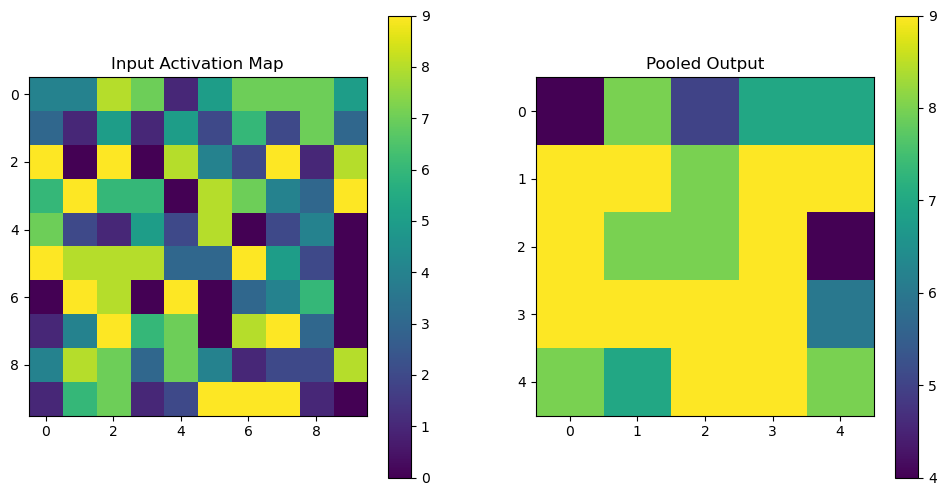

In [51]:
# Generate a random activation map
input_map = np.random.rand(10, 10) * 10
input_map = input_map.astype(int)  # Convert to integer for simplicity

# Pooling parameters
pool_size = 2
stride = 2


# Apply pooling
pooled_output = pooling_fun(input_map, stride, pool_size, max_pooling)

# Display the input activation map and the pooled output
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Input Activation Map")
plt.imshow(input_map, cmap='viridis')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Pooled Output")
plt.imshow(pooled_output, cmap='viridis')
plt.colorbar()

plt.show()

# Convolution Layer

In [52]:
def convolution_layer(input_volume: np.ndarray, no_of_filters: int, kernel_dimensions: int, stride: int, padding: int, non_linear_activation_fun: Callable[[np.ndarray], np.ndarray]) -> np.ndarray:
    height, width, depth = input_volume.shape

    filters = np.random.rand(no_of_filters, kernel_dimensions, kernel_dimensions, depth)
    
    output_height = (height - kernel_dimensions + 2 * padding ) // stride + 1
    output_width = (width - kernel_dimensions + 2 * padding) // stride + 1

    output = np.zeros((output_height, output_width, no_of_filters))

    for z in range(no_of_filters):
        output[:, :, z] = convolution_fun(input_volume, filters[z], stride, padding, non_linear_activation_fun)

    return output

Original image shape: (224, 224, 3)
Output Volume Shape: (224, 224, 10)


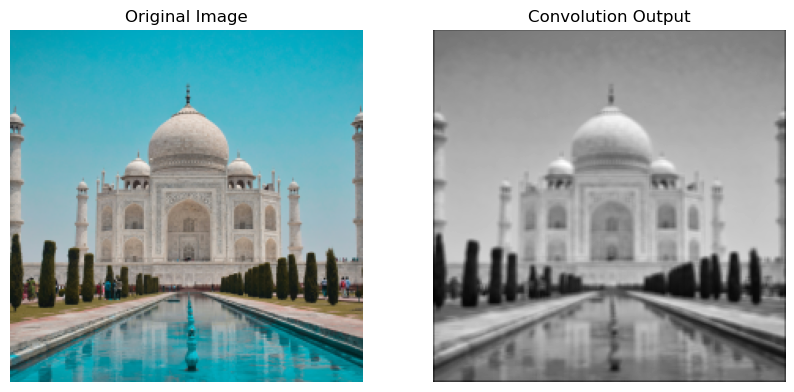

In [53]:
# Read the image
# image_path = "IITH_logo_Small.jpg"
image_path = "Taj_Square_Size_224.png"
image = plt.imread(image_path)
# If the image has an alpha channel, you might want to remove it or convert the image to grayscale
if image.shape[2] == 4:
    image = image[:, :, :3]

input_image = image

print("Original image shape:", image.shape)
# Create a sample input image (e.g., 8x8 image with 3 channels)
# input_image = np.random.rand(8, 8, 3)

# Convolution parameters
no_of_filters = 10
kernel_dimensions = 3
stride = 1
padding = 1

# Run the convolution layer function
output_volume = convolution_layer(input_image, no_of_filters, kernel_dimensions, stride, padding, relu)

# Print the output shape and a sample of the output
print("Output Volume Shape:", output_volume.shape)

# Visualize the input image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')  # Use cmap='gray' for grayscale images
plt.title('Original Image')
plt.axis('off')


# Normalize the output if necessary
if np.max(output_volume) > 1.0:
    output_volume_normalized = output_volume / np.max(output_volume)
else:
    output_volume_normalized = output_volume

plt.subplot(1, 2, 2)
plt.imshow(output_volume_normalized[:, :, 2], cmap='gray')  # Visualizing the first filter's output
plt.title('Convolution Output')
plt.axis('off')

plt.show()

In [54]:
def plotly_3d_conv_output_planes_with_colorbar(output_volume):
    depth = output_volume.shape[2]
    surfaces = []

    for z in range(depth):
        # Extracting the layer
        layer_data = output_volume[:, :, z]

        # Check if it's the last surface to enable the color scale
        showscale = True if z == depth - 1 else False

        # Generating surface for the layer
        surface = go.Surface(z=layer_data + z * 0.5,  # Offset layers for visibility
                             showscale=showscale,  # Show the color scale bar for the last surface
                             colorscale='Viridis')
        surfaces.append(surface)

    # Create figure
    fig = go.Figure(data=surfaces)

    # Customize layout
    fig.update_layout(title='3D Convolution Layer Output as Planes',
                      scene=dict(zaxis=dict(title='Depth/Filter'),
                                 xaxis_title='X Axis',
                                 yaxis_title='Y Axis',
                                 aspectmode='manual',
                                 aspectratio=dict(x=1, y=1, z=0.5)),  # Adjust aspect ratio for better visibility
                      margin=dict(l=0, r=0, b=0, t=30))

    fig.show()

plotly_3d_conv_output_planes_with_colorbar(output_volume_normalized)

# Pooling Layer

In [55]:
def pooling_layer(activation_map: np.ndarray, isGPA: bool, pool_fun: Callable[[np.ndarray], np.ndarray], stride: int = 1, pool_kernel_size: int = 2) -> np.ndarray:
    if isGPA:
        return pooling_fun(activation_map, 1, activation_map.shape[0], avg_pooling)
    else:
        return pooling_fun(activation_map, stride, pool_kernel_size, pool_fun)
        

Original image shape: (224, 224, 3)
Pooled shape is: (112, 112, 3)


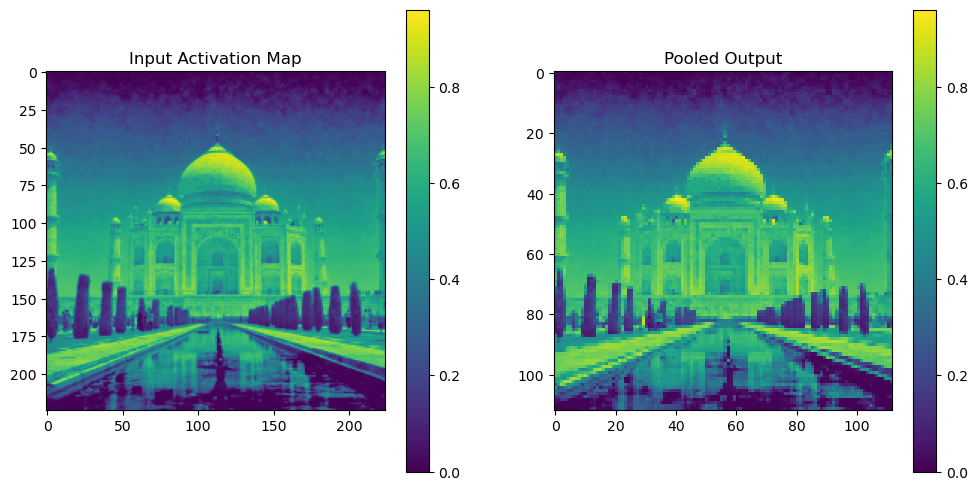

In [56]:
# Read the image
image_path = "Taj_Square_Size_224.png"
# image_path = "IITH_logo_Small.jpg"
image = plt.imread(image_path)
# If the image has an alpha channel, you might want to remove it or convert the image to grayscale
if image.shape[2] == 4:
    image = image[:, :, :3]

input_image = image

print("Original image shape:", image.shape)

# Pooling parameters
pool_size = 2
stride = 2


# Apply pooling
pooled_output = pooling_layer(activation_map=input_image, pool_fun=max_pooling, stride=stride, isGPA=False)
print("Pooled shape is:", pooled_output.shape)
# Display the input activation map and the pooled output
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Input Activation Map")
plt.imshow(input_image[:, :, 0], cmap='viridis')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Pooled Output")
plt.imshow(pooled_output[:, :, 0], cmap='viridis')
plt.colorbar()

plt.show()

In [57]:
# Normalize the output if necessary
if np.max(pooled_output) > 1.0:
    output_volume_normalized = pooled_output / np.max(pooled_output)
else:
    output_volume_normalized = pooled_output
plotly_3d_conv_output_planes_with_colorbar(output_volume_normalized)

Original image shape: (224, 224, 3)
Pooled shape is: (1, 1, 3)


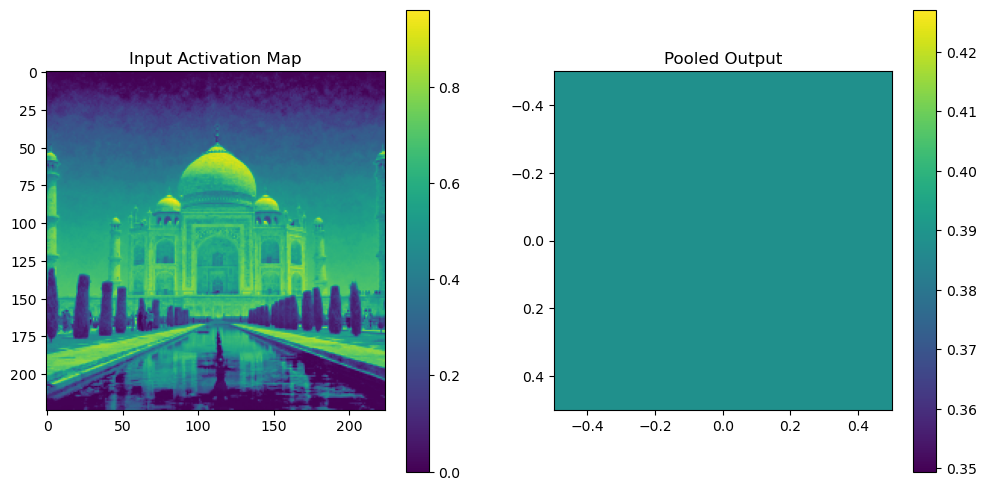

In [58]:
# Read the image
image_path = "Taj_Square_Size_224.png"
# image_path = "IITH_logo_Small.jpg"
image = plt.imread(image_path)
# If the image has an alpha channel, you might want to remove it or convert the image to grayscale
if image.shape[2] == 4:
    image = image[:, :, :3]

input_image = image

print("Original image shape:", image.shape)

# Pooling parameters
pool_size = 2
stride = 2


# Apply pooling
pooled_output = pooling_layer(activation_map=input_image, pool_fun=max_pooling, stride=stride, isGPA=True)
print("Pooled shape is:", pooled_output.shape)
# Display the input activation map and the pooled output
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Input Activation Map")
plt.imshow(input_image[:, :, 0], cmap='viridis')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Pooled Output")
plt.imshow(pooled_output[:, :, 0], cmap='viridis')
plt.colorbar()

plt.show()

Pooled shape is: (1, 1, 3)


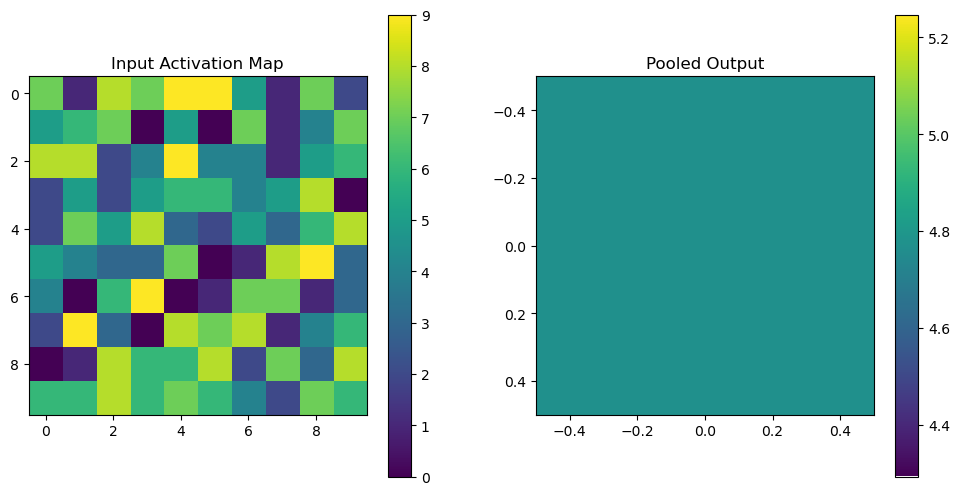

In [59]:
# Generate a random activation map
input_map = np.random.rand(10, 10, 3) * 10
input_map = input_map.astype(int)  # Convert to integer for simplicity

# Pooling parameters
pool_size = 2
stride = 2


# Apply pooling
pooled_output = pooling_layer(input_map, stride, True, max_pooling)
print("Pooled shape is:", pooled_output.shape)
# Display the input activation map and the pooled output
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Input Activation Map")
plt.imshow(input_map[:, :, 0], cmap='viridis')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Pooled Output")
plt.imshow(pooled_output[:, :, 0], cmap='viridis')
plt.colorbar()

plt.show()

# MLP
### Disclaimer: Using the previous assignment MLP implementation


In [60]:
import numpy as np

class MLP:
    def __init__(self, num_nodes: int, eta: float):
        self.nodes_per_layer = [num_nodes]
        self.weights = []
        self.biases = []
        self.activation_functions = []
        self.eta = eta
        self.loss_history = []
        self.accuracy_history = []

    def add_layer(self, num_nodes: int, activation_function="sigmoid"):
        prev_num_nodes = self.nodes_per_layer[-1]
        if activation_function == 'relu':
            weight = np.random.randn(prev_num_nodes, num_nodes) * np.sqrt(2.0 / prev_num_nodes)
        else:
            weight = np.random.rand(prev_num_nodes, num_nodes)
        
        self.nodes_per_layer.append(num_nodes)
        self.weights.append(weight)
        self.biases.append(np.random.rand(num_nodes))
        self.activation_functions.append(activation_function)
        print(f"Added layer with {num_nodes} nodes.")

    @staticmethod
    def sigmoid(x, der=False):
        if not der:
            return 1 / (1 + np.exp(-x))
        else:
            sig = 1 / (1 + np.exp(-x))
            return sig * (1 - sig)

    @staticmethod
    def relu(x, der=False):
        if not der:
            return np.maximum(0, x)
        else:
            return (x > 0).astype(float)
    
    @staticmethod
    def softmax(x, der=False):
        if not der:
            return np.exp(x) / np.sum(np.exp(x))
        else:
            s = np.exp(x) / np.sum(np.exp(x))
            return s * (1 - s)
    
    @staticmethod
    def no_non_linear_fun(x, der=False):
        if not der:
            return x
        else:
            return 1

    @staticmethod
    def selector_fun(x, function: str, der=False):
        if function == "sigmoid":
            return MLP.sigmoid(x, der)
        elif function == "relu":
            return MLP.relu(x, der)
        elif function == "softmax":
            return MLP.softmax(x, der)
        elif function == "none":
            return MLP.no_non_linear_fun(x, der)  
        else:
            raise ValueError(f"Unknown activation function: {function}")

    
    @staticmethod
    def cross_entropy_loss(y_pred, y_true):
        # Compute the cross-entropy loss
        return -np.sum(y_true * np.log(y_pred + 1e-15) + (1 - y_true) * np.log(1 - y_pred + 1e-15)) / y_true.size


    def forward_propagation(self, x):
        a_lists = [x]        

        for i in range(len(self.weights)):
            z = np.dot(a_lists[-1], self.weights[i]) + self.biases[i]
            a_lists.append(self.selector_fun(z, self.activation_functions[i]))
        return a_lists

    def back_propagation(self, a_lists, y):
        grad_wrt_y = a_lists[-1] - y
        grad_list = [None] * len(self.weights)
        grad_list[-1] = grad_wrt_y
        for k in range(len(self.weights) - 1, 0, -1):
            error_term = np.dot(grad_list[k], self.weights[k].T)
            grad_list[k - 1] = error_term * self.selector_fun(a_lists[k], self.activation_functions[k-1], der=True)

        grad_wrt_weights = [np.dot(a_lists[i].T, grad_list[i]) for i in range(len(self.weights))]
        grad_wrt_biases = [np.sum(grad_list[i], axis=0) for i in range(len(self.weights))]

        return grad_wrt_weights, grad_wrt_biases

    def train(self, x, y, max_epoch=1000):
        for epoch in range(max_epoch):
            a_lists = self.forward_propagation(x)
            grad_wrt_weights, grad_wrt_biases = self.back_propagation(a_lists, y)
            
            # Update weights and biases using vectorized operations
            self.weights = [w - self.eta * dw for w, dw in zip(self.weights, grad_wrt_weights)]
            self.biases = [b - self.eta * db for b, db in zip(self.biases, grad_wrt_biases)]

            # Record loss and accuracy
            loss = self.cross_entropy_loss(a_lists[-1], y)  # Cross-entropy loss
            accuracy = np.mean((a_lists[-1].round() == y).astype(float))
            self.loss_history.append(loss)
            self.accuracy_history.append(accuracy)

    def predict(self, x):
        return self.forward_propagation(x)[-1]


In [61]:
def MLP_fun(input_vec: np.ndarray, hidden_layers_size : np.ndarray, output_layer_size: int, non_linear_function: str, output_non_linear_function: str) -> np.ndarray:
    # Initialize and train MLP
    mlp = MLP(num_nodes=input_vec.shape[0], eta=0.01)
    
    for size in hidden_layers_size:
        mlp.add_layer(size, non_linear_function)
    
    mlp.add_layer(output_layer_size, output_non_linear_function)
    
    return np.array(mlp.forward_propagation(input_vec)[-1])


In [62]:
input_vec = input_map.reshape(-1)
print(input_vec.shape)

# Set the size of the first hidden layer to match the number of features
hidden_layers_size = [3]

output_with_softmax = MLP_fun(input_vec, hidden_layers_size, 6, "relu", "softmax")
output_without_softmax = MLP_fun(input_vec, hidden_layers_size, 9, "relu", "none")

print("Output with softmax shape:", output_with_softmax.shape)
print("Output without softmax shape:", output_without_softmax.shape)


(300,)
Added layer with 3 nodes.
Added layer with 6 nodes.
Added layer with 3 nodes.
Added layer with 9 nodes.
Output with softmax shape: (6,)
Output without softmax shape: (9,)


# Putting-it all together

Original image shape: (224, 224, 3)


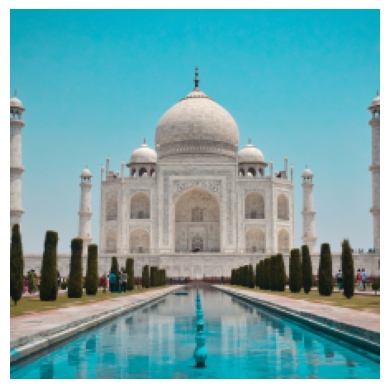

In [63]:
# Read the image
image_path = "Taj_Square_Size_224.png"
# image_path = r"tiny-imagenet-200\train\n01443537\images\n01443537_0.JPEG"

image = plt.imread(image_path)
# If the image has an alpha channel, you might want to remove it or convert the image to grayscale
if image.shape[2] == 4:
    image = image[:, :, :3]

print("Original image shape:", image.shape)

# Normalize the result for display purposes
image_normalized = image - image.min()
image_normalized = image_normalized / image_normalized.max()

# Display the image inline
plt.imshow(image_normalized.squeeze())#, cmap='gray')
plt.axis('off')  # Optional: to not display axes for cleaner visualization
plt.show()

In [64]:
resulted_image = image
resulted_image = convolution_layer(resulted_image, 16, 5, 1, 0, relu)
print("Result shape", resulted_image.shape)
resulted_image = pooling_layer(resulted_image, False, max_pooling, pool_kernel_size=2, stride=2)
print("Result shape", resulted_image.shape)
resulted_image = convolution_layer(resulted_image, 32, 3, 1, 0, sigmoid)
print("Result shape", resulted_image.shape)
resulted_image = pooling_layer(resulted_image, False, max_pooling, pool_kernel_size=2, stride=2)
print("Result shape", resulted_image.shape)
resulted_image = pooling_layer(resulted_image, True, max_pooling)
print("Result shape", resulted_image.shape)

input_vec = resulted_image.reshape(-1)
print("After Flattning shape: ", input_vec.shape)

resulted_output = MLP_fun(input_vec, [input_vec.shape[0]], 1000, "relu", "softmax")

print("Final Result shape", resulted_output.shape)



Result shape (220, 220, 16)
Result shape (110, 110, 16)
Result shape (108, 108, 32)
Result shape (54, 54, 32)
Result shape (1, 1, 32)
After Flattning shape:  (32,)
Added layer with 32 nodes.
Added layer with 1000 nodes.
Final Result shape (1000,)


# RNN

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch.optim as optim

## Data Genration

In [66]:
def data_generator(number_samples: int, max_len_input_sequence: int) -> tuple[list, list]:
    sequences = []
    sums = []

    for _ in range(number_samples):
        # Generate a random sequence length
        seq_len = np.random.randint(2, max_len_input_sequence + 1)
        
        # Create the sequence with random values in the first dimension
        sequence = torch.zeros((seq_len, 2)).double()
        sequence[:, 0] = torch.rand(seq_len).double()
        
        # Randomly choose two distinct positions for the markers
        markers = torch.tensor(np.random.choice(seq_len, 2, replace=False))
        sequence[markers, 1] = 1
        
        # Calculate the sum of the marked values
        sum_values = torch.sum(sequence[markers, 0])

        # Append the sequence and its sum to the respective lists
        sequences.append(sequence)
        sums.append(sum_values)
    
    return sequences, sums


In [67]:
# Generate data
def set_seed(seed_value=42):
    torch.manual_seed(seed_value)
    np.random.seed(seed_value)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed_value)

set_seed(70)  # Setting the seed for reproducibility
sequences, sums = data_generator(5000, 20)

# Example usage: print the first sample
print(sequences[0])
print("Sum:", sums[0])

X_train, X_test, y_train, y_test = train_test_split(sequences, sums, test_size=0.33, random_state=42)

# X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)
print(type(sums[0]))

tensor([[0.4350, 0.0000],
        [0.3591, 1.0000],
        [0.3411, 0.0000],
        [0.2644, 0.0000],
        [0.6656, 0.0000],
        [0.1341, 0.0000],
        [0.7236, 0.0000],
        [0.6668, 0.0000],
        [0.1091, 0.0000],
        [0.5745, 0.0000],
        [0.8901, 0.0000],
        [0.2919, 0.0000],
        [0.0407, 0.0000],
        [0.4504, 0.0000],
        [0.0274, 1.0000],
        [0.5183, 0.0000]], dtype=torch.float64)
Sum: tensor(0.3866, dtype=torch.float64)
<class 'torch.Tensor'>


In [68]:
def plot_training_loss(loss_history):

    epochs = list(loss_history.keys())
    losses = list(loss_history.values())

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, losses, label='Training Loss', marker='o')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

### Parameter Initalization

In [69]:
input_size = 2
hidden_size = 10
output_size = 1
eta = 0.05
epoch = 25

# Elmon

In [70]:
class ElmanRNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(ElmanRNN, self).__init__()

        self.W_hx = nn.Linear(input_size, hidden_size, bias=False)  # Input to hidden
        self.W_hh = nn.Linear(hidden_size, hidden_size)  # Hidden to hidden
        self.W_hy = nn.Linear(hidden_size, output_size)  # Hidden to output
        
        self.double()  # Use double precision weights

    def forward(self, X, H):
        hidden_input = self.W_hx(X)
        hidden_hidden = self.W_hh(H)
        hidden_next = torch.tanh(hidden_input + hidden_hidden)

        output = self.W_hy(hidden_next)
        return output, hidden_next


In [71]:
# Dictionary to store training loss history
losses_elmon = {}
elmanModel = ElmanRNN(input_size, hidden_size, output_size)
# Mean Squared Error loss function
loss_fun = nn.MSELoss()

# Adam optimizer
optimizer = torch.optim.Adam(elmanModel.parameters(), lr=eta)

# Training loop
for _ in tqdm(range(epoch)):
    losses = []  # Temporary list to store loss for each epoch
    
    for X_batch, Y_batch in zip(X_train, y_train):
        elmanModel.zero_grad()  # Reset gradients
        hidden = torch.zeros(1, hidden_size, dtype=torch.float64)  # Initialize hidden state
        
        # Process each time step in the input sequence
        for i in range(X_batch.shape[0]):
            output, hidden = elmanModel(X_batch[i], hidden)
        
        # Calculate loss for the final output
        loss = loss_fun(output, Y_batch)
        loss.backward()  # Backpropagation
        
        # Prevent exploding gradients
        nn.utils.clip_grad_norm_(elmanModel.parameters(), 3)
        
        optimizer.step()  # Update model parameters
        losses.append(loss.item())  # Store loss for this epoch
    
    # Store the average loss for this epoch
    losses_elmon[_] = torch.mean(torch.tensor(losses))


  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [01:49<00:00,  4.37s/it]


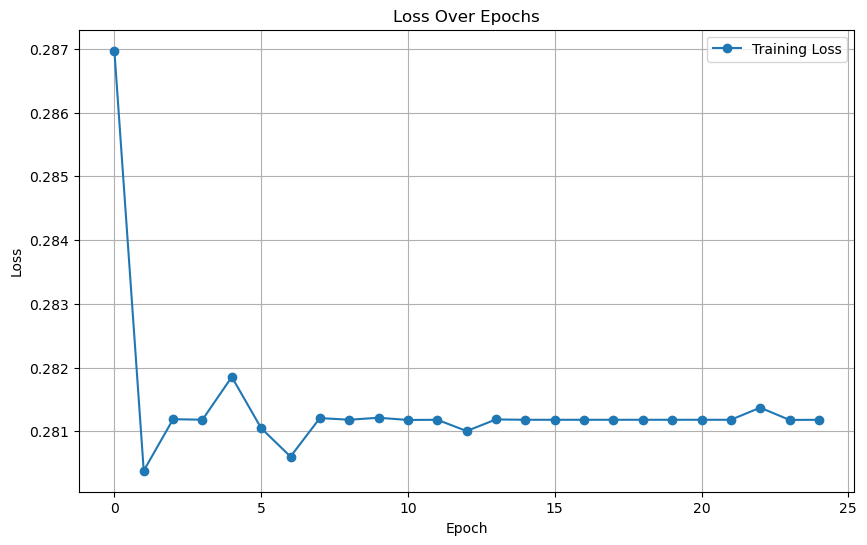

In [72]:
plot_training_loss(losses_elmon)

In [73]:
def calculate_accuracy_elman_rnn(model, X_test, y_test, threshold=0.02):

    
    total_test_points = 0
    correct_predictions = 0
    hidden_size = model.W_hh.out_features 

    for X_batch, Y_true in zip(X_test, y_test):
        hidden_state = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
        for time_step in range(X_batch.shape[0]):
            output, hidden_state = model(X_batch[time_step], hidden_state)
        
        is_correct = abs(output.item() - Y_true.item()) < threshold
        correct_predictions += is_correct
        total_test_points += 1

    accuracy = correct_predictions / total_test_points
    return accuracy


# LSTM

In [74]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()

        self.W_ix = nn.Linear(input_size, hidden_size, bias=False)
        self.W_ih = nn.Linear(hidden_size, hidden_size)

        self.W_ox = nn.Linear(input_size, hidden_size, bias=False)
        self.W_oh = nn.Linear(hidden_size, hidden_size)

        self.W_fx = nn.Linear(input_size, hidden_size, bias=False)
        self.W_fh = nn.Linear(hidden_size, hidden_size)

        self.W_cx = nn.Linear(input_size, hidden_size)
        self.W_ch = nn.Linear(hidden_size, hidden_size)

        self.W_hy = nn.Linear(hidden_size, output_size)

        self.double()
    
    def forward(self, X, H, C):
        f_t = torch.sigmoid(self.W_fx(X) + self.W_fh(H))
        i_t = torch.sigmoid(self.W_ix(X) + self.W_ih(H))
        o_t = torch.sigmoid(self.W_ox(X) + self.W_oh(H))     

        c_t_ = torch.sigmoid(self.W_cx(X))
        C = (f_t * C) + (i_t * c_t_)

        H = o_t * torch.sigmoid(C)

        output = self.W_hy(H)
        return output, H, C




In [75]:
losses_lstm = {}

loss_fun = nn.MSELoss()
lstmModel = LSTM(2, 10, 1)
optimizer = torch.optim.Adam(lstmModel.parameters(), lr=0.05)

for _ in tqdm(range(epoch)):
  losses = []
  for X_batch, Y_batch in zip(X_train, y_train):
    lstmModel.zero_grad()
    loss = 0
    hidden = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
    cell = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
    
    for i in range(X_batch.shape[0]):
      output, hidden, cell = lstmModel(X_batch[i, :], hidden, cell)
    loss = loss_fun(output, Y_batch)
    loss.backward()
    nn.utils.clip_grad_norm_(lstmModel.parameters(), 3)
    optimizer.step()
    losses.append(loss.detach().item())
  losses_lstm[_] = torch.tensor(losses).mean()

 60%|██████    | 15/25 [03:12<02:10, 13.07s/it]

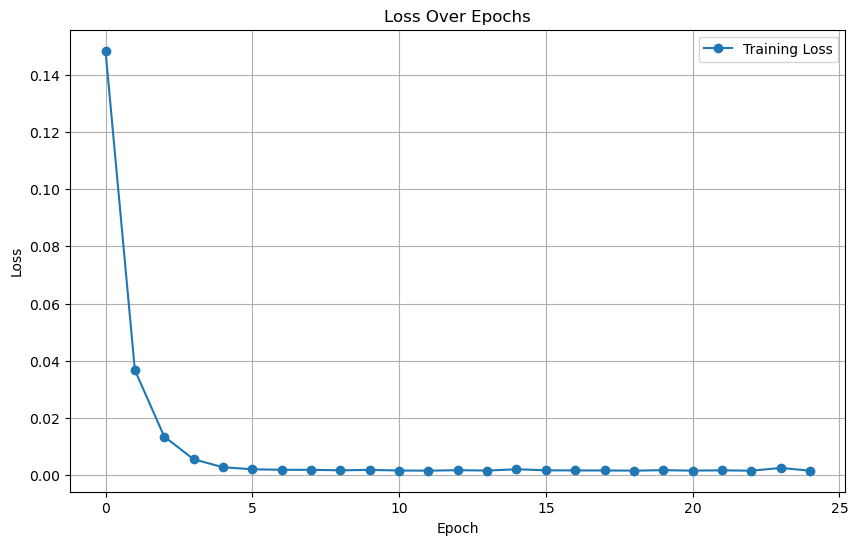

In [ ]:
plot_training_loss(losses_lstm)

In [ ]:
def calculate_lstm_accuracy(model, X_test, y_test, hidden_size, threshold=0.02):

    total_test_points = 0
    correct_predictions = 0
    
    # Ensure the model is in evaluation mode
    model.eval()

    with torch.no_grad():  # Disable gradient computation for efficiency
        for X_, Y_ in zip(X_test, y_test):
            # Initialize hidden and cell states
            hidden_state = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
            cell_state = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
            
            # Sequentially pass each time step of the input through the model
            for i in range(X_.shape[0]):
                output, hidden_state, cell_state = model(X_[i, :], hidden_state, cell_state)
            
            # Check if the prediction is within the threshold
            if abs(output.item() - Y_.item()) < threshold:
                correct_predictions += 1
            total_test_points += 1

    # Calculate and return the accuracy
    accuracy = correct_predictions / total_test_points
    return accuracy


# GRU

In [ ]:
# GRU Model Definition
class GRUModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(GRUModel, self).__init__()
        
        # Define gates without bias for input and with bias for hidden
        self.W_z = nn.Linear(input_size, hidden_size, bias=False)
        self.W_zh = nn.Linear(hidden_size, hidden_size)
        self.W_r = nn.Linear(input_size, hidden_size, bias=False)
        self.W_rh = nn.Linear(hidden_size, hidden_size)
        self.W = nn.Linear(input_size, hidden_size, bias=False)
        self.W_h = nn.Linear(hidden_size, hidden_size, bias=False)

        # Output layer
        self.output_layer = nn.Linear(hidden_size, output_size)

        # Ensure the model uses double precision for weights
        self.double()
    
    def forward(self, input, hidden_state):
        # Update gate
        z_t = torch.sigmoid(self.W_z(input) + self.W_zh(hidden_state))
        
        # Reset gate
        r_t = torch.sigmoid(self.W_r(input) + self.W_rh(hidden_state))
        
        # New gate
        h_t_ = torch.tanh(self.W(input) + self.W_h(r_t * hidden_state))
        
        # Final hidden state
        h_t = (1 - z_t) * hidden_state + z_t * h_t_

        # Output
        output = self.output_layer(h_t)
        return output, h_t


In [ ]:
# Initialize empty dictionary to store training loss history for GRU
losses_gru = {}
gruModel = GRUModel(2, 10, 1)
# Loss function and optimizer
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(gruModel.parameters(), lr=0.001)

# Training loop
for _ in tqdm(range(epoch)):
    losses = []

    for X_batch, Y_batch in zip(X_train, y_train):
        # Reset gradients
        gruModel.zero_grad()

      # Before the training loop
        X_batch = X_batch.double()  # Convert input data to double
        Y_batch = Y_batch.double()  # Convert target data to double

        # When initializing the hidden state
        hidden = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)  # Ensure hidden is also double

        
        # Process each time step
        for i in range(X_batch.shape[0]):
            output, hidden = gruModel(X_batch[i], hidden)
        
        # Compute loss
        loss = loss_function(output, Y_batch)
        
        # Backpropagation
        loss.backward()
        
        # Gradient clipping
        nn.utils.clip_grad_norm_(gruModel.parameters(), 3)
        
        # Update model parameters
        optimizer.step()
        
        # Store loss
        losses.append(loss.item())
    
    # Store the average loss for the epoch
    losses_gru[_] = np.mean(losses)

100%|██████████| 25/25 [04:32<00:00, 10.91s/it]


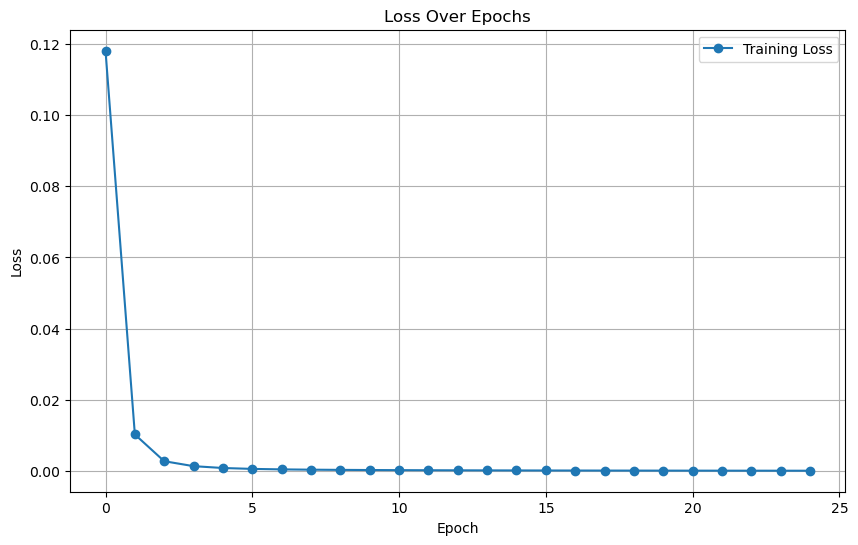

In [ ]:
plot_training_loss(losses_gru)

In [ ]:
def calculate_gru_accuracy(model, X_test, y_test, hidden_size, threshold=0.02):
    total_test_points = 0
    correct_predictions = 0
    for X_batch, Y_target in zip(X_test, y_test):
        hidden = torch.zeros(1, hidden_size, requires_grad=False, dtype=torch.float64)
        output = 0
        for i in range(X_batch.shape[0]):
            output, hidden = model(X_batch[i].unsqueeze(0), hidden)
        if abs(output.item() - Y_target.item()) < threshold:
            correct_predictions += 1
        total_test_points += 1
    accuracy = correct_predictions / total_test_points
    return accuracy


## Accuracy

In [ ]:
ElmanRNN_accuracy = calculate_accuracy_elman_rnn(elmanModel, X_test, y_test)
print(f"Elmon Accuracy: {ElmanRNN_accuracy:.4f}")
lstm_accuracy = calculate_lstm_accuracy(lstmModel, X_test, y_test, hidden_size)
print(f"LSTM Accuracy: {lstm_accuracy:.4f}")
gru_accuracy = calculate_gru_accuracy(gruModel, X_test, y_test, 10)
print(f"GRU Accuracy: {gru_accuracy:.4f}")


Elmon Accuracy: 0.0321
LSTM Accuracy: 0.3158
GRU Accuracy: 0.9618


# BaseLine

c:\Users\gupta\anaconda3\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning:

Using a target size (torch.Size([])) that is different to the input size (torch.Size([3350])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



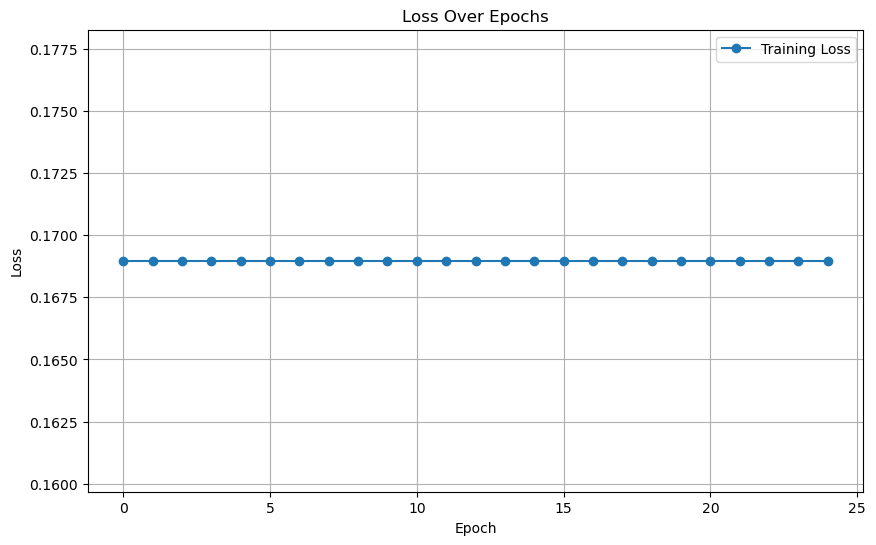

In [ ]:
prediction = torch.ones(len(y_train))
losses_baseline = {}
loss_fun = nn.MSELoss()
for _ in range(epoch):
    losses = []
    for Y in y_train:        
        loss = loss_fun(prediction, Y)
        losses.append(loss.item())
    losses_baseline[_] = np.array(losses).mean()

plot_training_loss(losses_baseline)

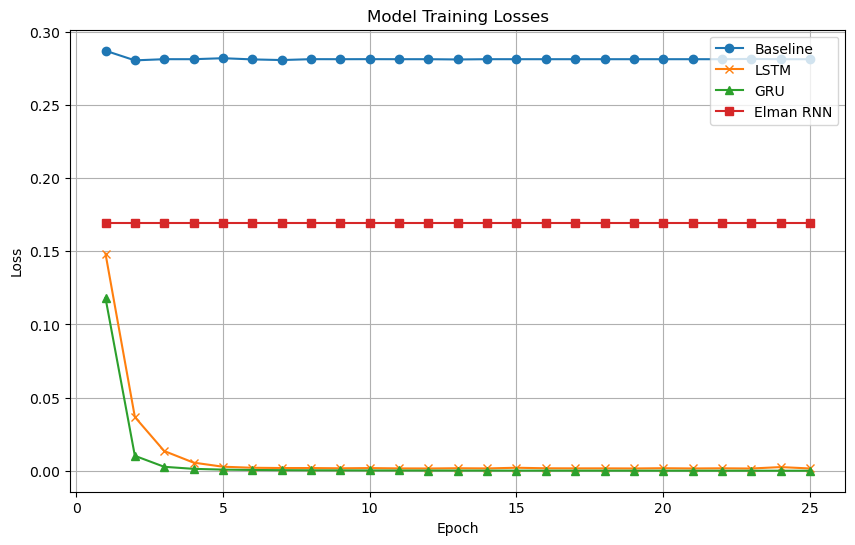

In [ ]:
def plot_model_losses(losses_elman, losses_lstm, losses_gru, losses_baseline):

    plt.figure(figsize=(10, 6))

    # Convert dictionary values to lists for plotting
    elman_losses = list(losses_elman.values())
    lstm_losses = list(losses_lstm.values())
    gru_losses = list(losses_gru.values())
    baseline_losses = list(losses_baseline.values())

    epochs = range(1, len(elman_losses) + 1)

    plt.plot(epochs, elman_losses, label='Baseline', marker='o')
    plt.plot(epochs, lstm_losses, label='LSTM', marker='x')
    plt.plot(epochs, gru_losses, label='GRU', marker='^')
    plt.plot(epochs, baseline_losses, label='Elman RNN', marker='s')

    plt.title('Model Training Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.show()


plot_model_losses(losses_elmon, losses_lstm, losses_gru, losses_baseline)
